In [53]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import os
import numpy as np
import cv2
import imutils
import random
import mahotas

from IPython.display import display, Image
from matplotlib import pyplot as plt

%matplotlib inline

In [2]:
airplane_datapath = "/Users/sam/All-Program/App-DataSet/Kaggle-Challenges/CIFAR-10/trainDataAirplane/"
cat_datapath = "/Users/sam/All-Program/App-DataSet/Kaggle-Challenges/CIFAR-10/trainDataCat/"

In [3]:
dirDict = [airplane_datapath,cat_datapath]

imagePath = []
for dirs in dirDict:
    dir_arr = os.listdir(dirs)
    random.shuffle(dir_arr)
    files = dir_arr[10:50]
    imagePath += [dirs+f for f in files]
print (imagePath)

['/Users/sam/All-Program/App-DataSet/Kaggle-Challenges/CIFAR-10/trainDataAirplane/5315.png', '/Users/sam/All-Program/App-DataSet/Kaggle-Challenges/CIFAR-10/trainDataAirplane/21144.png', '/Users/sam/All-Program/App-DataSet/Kaggle-Challenges/CIFAR-10/trainDataAirplane/24114.png', '/Users/sam/All-Program/App-DataSet/Kaggle-Challenges/CIFAR-10/trainDataAirplane/49718.png', '/Users/sam/All-Program/App-DataSet/Kaggle-Challenges/CIFAR-10/trainDataAirplane/13576.png', '/Users/sam/All-Program/App-DataSet/Kaggle-Challenges/CIFAR-10/trainDataAirplane/48296.png', '/Users/sam/All-Program/App-DataSet/Kaggle-Challenges/CIFAR-10/trainDataAirplane/13481.png', '/Users/sam/All-Program/App-DataSet/Kaggle-Challenges/CIFAR-10/trainDataAirplane/25351.png', '/Users/sam/All-Program/App-DataSet/Kaggle-Challenges/CIFAR-10/trainDataAirplane/16066.png', '/Users/sam/All-Program/App-DataSet/Kaggle-Challenges/CIFAR-10/trainDataAirplane/44885.png', '/Users/sam/All-Program/App-DataSet/Kaggle-Challenges/CIFAR-10/trainDa

In [4]:
def vizualize(imageArray, rows, columns, figsize=(40, 6)):
    fig1, axs = plt.subplots(rows,columns, figsize=figsize, facecolor='y', edgecolor='k')
    if columns>1:
        axs = axs.ravel()
    for no, image in enumerate(imageArray):
        axs[no].imshow(image)

In [5]:
def image_standarize1(image):
    return(image - 255.0/2)/255.0

def image_standarize2(image):
    return(image/255.0)

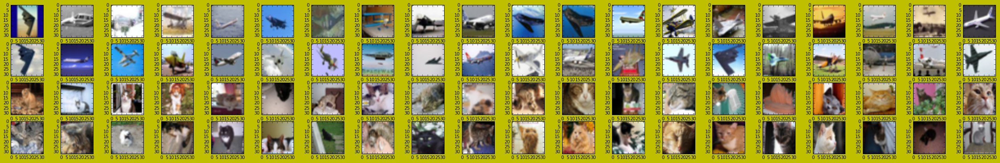

In [6]:
# Load the images using openCV
imageArr = [cv2.imread(img) for img in imagePath] 
# Note : Open CV reads an Image in BGR, so we have to convert it into RBG
imageArr = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in imageArr]
vizualize(imageArr,rows=4,columns=20)

## TensorFlow Image Preprocessing Operations:
------

In [24]:
def reset_graph():  # Reset the graph
    if 'sess' in globals() and sess:
        sess.close()
    tf.reset_default_graph()

(80, 32, 32, 3)
The shape of input image Tnsor is:  (80, 32, 32, 3)


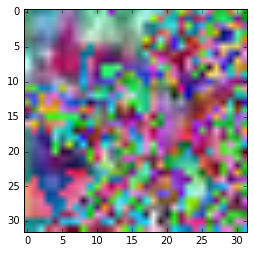

In [47]:
from scipy import misc
import tensorflow as tf

###############
imgTensor = np.ndarray(shape=(80,32,32,3), dtype='uint8')  # uint8 is defined for images: that takes on values between 0 and 255
print (imgTensor.shape)
for i,img in enumerate(imageArr):
    imgTensor[i,:] = img
    
print ('The shape of input image Tnsor is: ', imgTensor.shape)


# Sanity Check if all the image are stacked properly in teh inputTensor
# imgList = [imgTensor[i] for i in np.arange(imgTensor.shape[0])]
# vizualize(imgList,rows=4,columns=20)




# Now lets imagine the inputTensor is one batch of 80 images and we now do tensor flow image processing operation on it.
# def inputs(imgIN):
reset_graph()

#     trainData = tf.placeholder(tf.float32, [None, self.imageSize, self.imageSize, self.numChannels])
#     input_image = tf.placeholder()
    # We convert the unsigned integer into a float, we do it basically so that proper brightness, contrast and whitening can be applied to the image
distorted_image = tf.cast(imgTensor[6,:], tf.float32)
# Crop a portion from the image
#     distorted_image = tf.random_crop(distorted_image, [32, 32, 3])       # Given an image this operation will make a random crop of the image given the crop size
# Flip the image
distorted_image = tf.image.random_flip_left_right(distorted_image)   # Given an image this operation may or may not flip the image
# Add random brightness
distorted_image = tf.image.random_brightness(distorted_image,max_delta=63)
# Add random contrast
distorted_image = tf.image.random_contrast(distorted_image,lower=0.2, upper=1.8)
# Standarize: # Subtract off the mean and divide by the variance of the pixels.:
distorted_image = tf.image.per_image_whitening(distorted_image)


init = tf.initialize_all_variables()
sess = tf.Session()
sess.run(init)
im_distorted = sess.run(distorted_image)
    
# vizualize(imgOut,rows=4,columns=20)


import matplotlib.pyplot as plt
fig = plt.figure()
plt.imshow(im_distorted)
plt.show()

(80, 32, 32, 3)
The shape of input image Tnsor is:  (80, 32, 32, 3)
80
{'distorted_image': <tf.Tensor 'Div:0' shape=(32, 32, 3) dtype=float32>, 'imageIN': <tf.Tensor 'Placeholder:0' shape=(32, 32, 3) dtype=float32>}


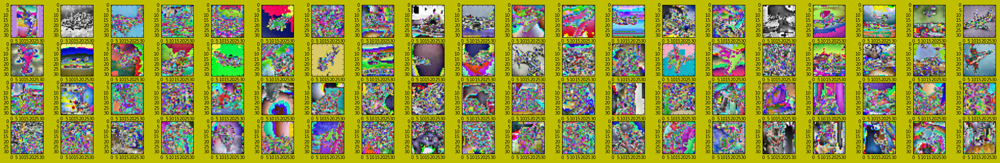

In [60]:
# Vizualizing Tensorflow operation

# Note Tensor flow takes input of 4 tensors, 
from scipy import misc
import tensorflow as tf

###############
imgTensor = np.ndarray(shape=(80,32,32,3), dtype='uint8')  # uint8 is defined for images: that takes on values between 0 and 255
print (imgTensor.shape)
for i,img in enumerate(imageArr):
    imgTensor[i,:] = img
    
print ('The shape of input image Tnsor is: ', imgTensor.shape)


# Sanity Check if all the image are stacked properly in teh inputTensor
# imgList = [imgTensor[i] for i in np.arange(imgTensor.shape[0])]
# vizualize(imgList,rows=4,columns=20)




# Now lets imagine the inputTensor is one batch of 80 images and we now do tensor flow image processing operation on it.
# def inputs(imgIN):


def imagePreprocessing(imageSize, numChannels):
    
    '''
        Normally the inputs have dtype unit8 (0-255), We however take the input as float32 because we perform 
        operations like brightness, contrast and whitening that doest arithmatic operation which many make the 
        pixels value as floating point.
    '''
    imageIN = tf.placeholder(tf.float32, [imageSize, imageSize, numChannels])
    
    # Crop a portion from the image
#     distorted_image = tf.random_crop(distorted_image, [32, 32, 3])       # Given an image this operation will make a random crop of the image given the crop size
    
    # Flip the image
    distorted_image = tf.image.random_flip_left_right(imageIN)   # Given an image this operation may or may not flip the image
    # Add random brightness
    distorted_image = tf.image.random_brightness(distorted_image,max_delta=63)
    # Add random contrast
    distorted_image = tf.image.random_contrast(distorted_image,lower=0.2, upper=1.8)
    # Standarize: # Subtract off the mean and divide by the variance of the pixels.:
    distorted_image = tf.image.per_image_whitening(distorted_image)
    
    return dict(imageIN=imageIN,
                 distorted_image=distorted_image)
#     return distorted_image



print (imgTensor.shape[0])
#     return distorted_image

reset_graph()
processGraphDict = imagePreprocessing(imageSize=32, numChannels=3)
print (processGraphDict)
with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())

    trainPreprocessOUT = np.ndarray(shape=(80,32,32,3), dtype='float32')
    for numImage in np.arange(imgTensor.shape[0]):
        feed_dict = {processGraphDict['imageIN']:imgTensor[numImage,:]}
        im_distorted = sess.run(processGraphDict['distorted_image'],feed_dict=feed_dict)
#         print (im_distorted)
        trainPreprocessOUT[numImage,:] = im_distorted

# print (trainPreprocessOUT)
imgOut = []
for numimg in np.arange(trainPreprocessOUT.shape[0]):
#     print (trainPreprocessOUT[numimg,:])
    imgOut.append(trainPreprocessOUT[numimg,:])
    
vizualize(imgOut,rows=4,columns=20)




In [ ]:


# Operations

# im_flipped = sess.run(flipped_image)
# im_bright = sess.run(bright_image)
# im_contrast = sess.run(contrast_image)
# im_float = sess.run(float_image)
# print ('The statistics of randomly cropped image is: ', im_distorted.shape)
# print ('The size of randomly flipped image is: ', im_flipped.shape)
# print ('The size of randomly brightned image is: ', im_bright.shape)
# print ('The size of randomly contrast image is: ', im_contrast.shape)
# print ('The size of randomly float_img image is: ', im_float.shape)


# Plots

# import matplotlib.pyplot as plt
# fig1, axs = plt.subplots(2,3, figsize=(6,6), facecolor='y', edgecolor='k')
# axs = axs.ravel()
# axs[0].imshow(im_distorted)


# img = misc.imread(imagePath[0])
# print (img.shape)    # (32, 32, 3)
# print (type(img))
# print (img.dtype)
# # imgTensor[0] = img
# imgTensor[0,:] = img
# # print (imgTensor.shape)
# print (img)
# print ('')
# print (imgTensor[0])
                       

# img_tf = tf.Variable(img)
# print (img_tf.get_shape().as_list())  # [32, 32, 3]

# print (img_tf.get_shape().as_list())

# # Initializing the session
# init = tf.initialize_all_variables()
# sess = tf.Session()
# sess.run(init)
# im = sess.run(img_tf)

# import matplotlib.pyplot as plt
# fig = plt.figure()
# fig.add_subplot(1,2,1)
# plt.imshow(im)
# fig.add_subplot(1,2,2)
# plt.imshow(img)
# plt.show()
# fig.add_subplot(2,1,1)
# plt.imshow(imgTensor[0])
# plt.show()

## OpenCV Image Preprocessing Opereations:
------

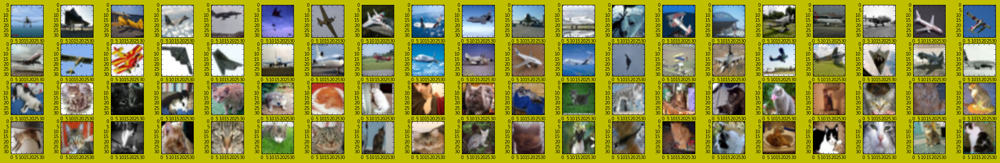

In [8]:
imgHFliped = [cv2.flip(img,1) for img in imageArr]
vizualize(imgHFliped, rows=4,columns=20)

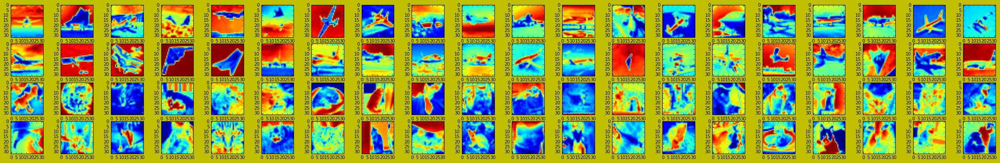

In [9]:
imageGray = [cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in imageArr] 
vizualize(imageGray,rows=4,columns=20)

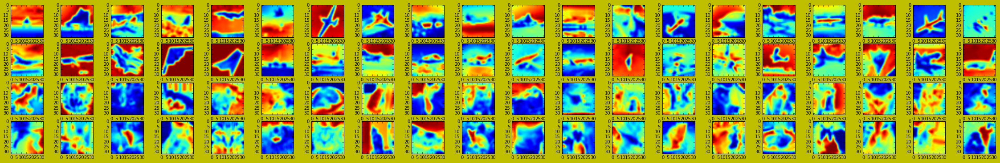

In [10]:
# Applyting Gaussian blurr blurr to the pictures
imageBlurr = [cv2.GaussianBlur(img, (3,3),3) for img in imageGray]
# A bigger value of sigma will result in better smooting. Since the image we are operating on is pretty small we would want to use a small kernel (filter) 
# and a small value of sigma
vizualize(imageBlurr,rows=4,columns=20)
# print (imageBlurr)

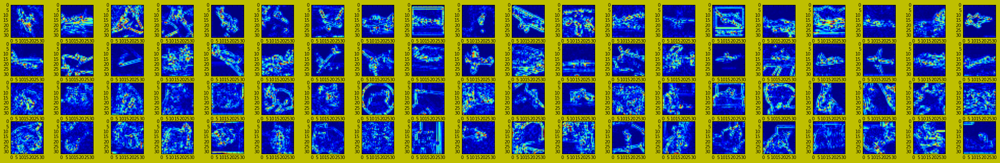

In [111]:
# Applying Edge detection Techniques, 1. Laplse Edge Detector.
imageLapEdge = [cv2.Laplacian(img, cv2.CV_64F) for img in imageGray]
imageLapEdge = np.uint8(np.absolute(imageLapEdge))
vizualize(imageLapEdge,rows=4,columns=20)

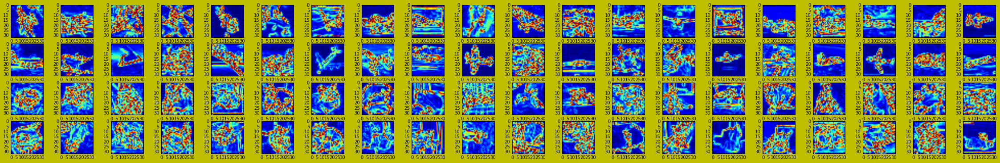

In [112]:
# Applying Edge detection Techniques, 1. Sobel Edge Detector.
# Now we shall use Sobel operator top determine the horizontal and vertical edges
def sobelEdge(img):
    sobelX= cv2.Sobel(img, cv2.CV_64F,1,0)
    sobelY= cv2.Sobel(img, cv2.CV_64F,0,1)
    sobelX = np.uint8(np.absolute(sobelX))#np.absolute(sobelX)
    sobelY = np.uint8(np.absolute(sobelY))#np.absolute(sobelY)
    sobelCombined = cv2.bitwise_or(sobelX, sobelY)
    return sobelCombined

imageSobEdge = [sobelEdge(img) for img in imageGray]
vizualize(imageSobEdge,rows=4,columns=20)

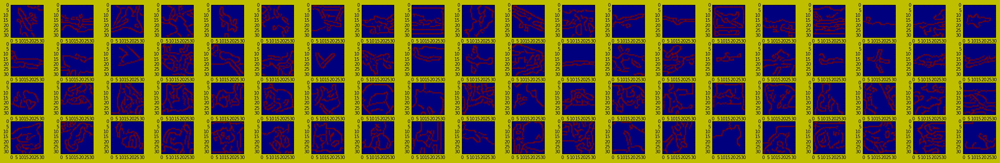

In [113]:
imageCannyEdge = [cv2.Canny(img, 30, 150) for img in imageBlurr]
vizualize(imageCannyEdge,rows=4,columns=20)

Below we skew the image , wrapaffine anf ceter the image. Have to work on it

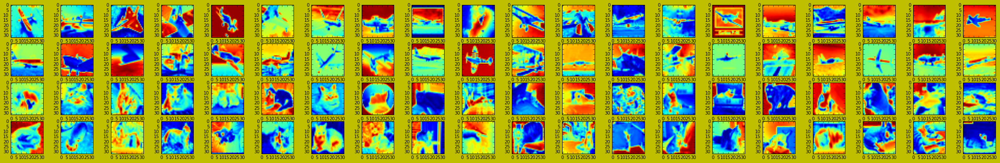

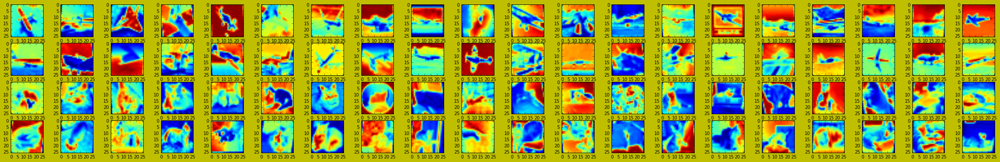

In [114]:
# Doesnt Work, Have to re do

def deskew(image, width):
#     print (image.shape)
    (h, w) = image.shape[:2]
#     print (h, w)
    moments = cv2.moments(image)
#     print (moments)
    skew = moments["mu11"] / moments["mu02"]
#     print (skew)
    M = np.float32([[1, skew, -0.5 * w * skew],[0, 1, 0]])
#     print (M)
    image = cv2.warpAffine(image, M, (w, h),
       flags = cv2.WARP_INVERSE_MAP | cv2.INTER_LINEAR)
#     print (image.shape)
    image = imutils.resize(image, width = width)
    return image

imgSkewed = [deskew(img, width=26) for no,img in enumerate(imageGray)]
vizualize(imageGray,rows=4,columns=20)
vizualize(imgSkewed,rows=4,columns=20)

It is a good idea to center the image:

/Users/sam/App-Setup/CondaENV/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


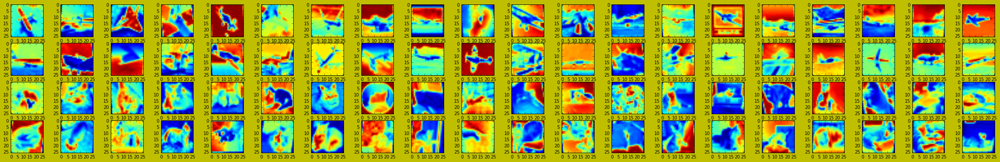

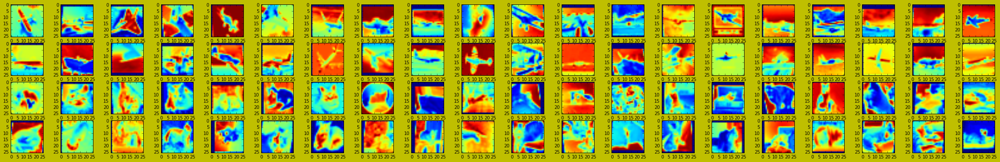

In [115]:
# Doesnt Work, Have to re do

def center_extent(image, size):
    (eW, eH) = size
    
    if image.shape[1] > image.shape[0]:
        image = imutils.resize(image, width = eW)
    else:
        image = imutils.resize(image, height = eH)
        
    extent = np.zeros((eH, eW), dtype = "uint8")
    offsetX = (eW - image.shape[1]) / 2
    offsetY = (eH - image.shape[0]) / 2
    
    extent[offsetY:offsetY + image.shape[0], offsetX:offsetX + image.shape[1]] = image
    CM = mahotas.center_of_mass(extent)
    (cY, cX) = np.round(CM).astype("int32")
    (dX, dY) = ((size[0] / 2) - cX, (size[1] / 2) - cY)
    M = np.float32([[1, 0, dX], [0, 1, dY]])
    extent = cv2.warpAffine(extent, M, size)
    
    return extent

# image = dataset.center_extent(image, (26, 26))
imgCenter = [center_extent(img, size=(26,26)) for no,img in enumerate(imgSkewed)]
vizualize(imgSkewed,rows=4,columns=20)
vizualize(imgCenter,rows=4,columns=20)

Here in the below, we use the HOG discreptor We also print the histograms to get a intuitive sense if the parameters we use makes sense or not.

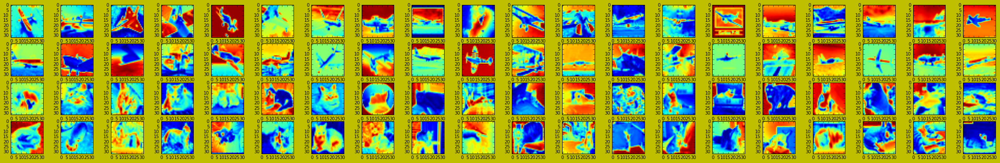

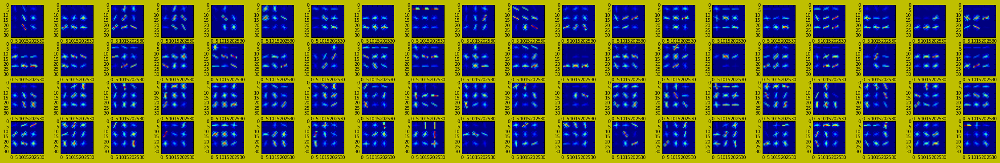

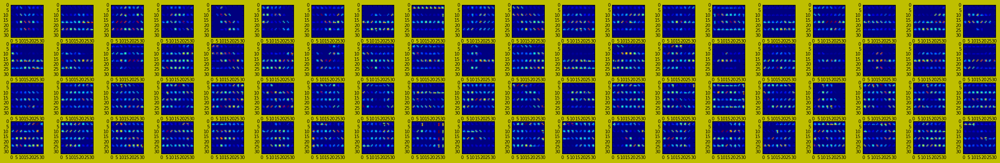

In [116]:
from skimage.feature import hog

class HOG:
    def __init__(self, featureParams): 
        self.orienations = featureParams['orientations']
        self.pixelsPerCell = featureParams['pixelsPerCell']
        self.cellsPerBlock = featureParams['cellsPerBlock']
        self.block_norm = featureParams['block_norm']
        self.visualise = featureParams['visualise']
        self.transform_sqrt = featureParams['transform_sqrt']

    def describe(self, image):
        # Use transform_sqrt for Power law Compression before processing the image to increase the accuracy
        # Use visualise to return the image of the histogram
        hist , hog_image = hog(image,
                            orientations = self.orienations,
                            pixels_per_cell = self.pixelsPerCell,
                            cells_per_block = self.cellsPerBlock,
                            visualise= self.visualise,
                            transform_sqrt = self.transform_sqrt)
#                             normalise = self.normalize)        # normalise is deprecated from the API

        return hist, hog_image

def hog_feature(featureParams,image_in):
#     print (featureParams)
    obj_HOG = HOG(featureParams)
    for no,img in enumerate(image_in):
        hist, hog_image = obj_HOG.describe(img)
        yield hog_image
        
featureParams1 = dict(orientations = 18, pixelsPerCell = (9, 9), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = True, transform_sqrt = True)
featureParams2 = dict(orientations = 18, pixelsPerCell = (4, 7), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = True, transform_sqrt = True)


imageType = imageGray

hogImageArr1 = [output for output in hog_feature(featureParams1 ,imageType)]
hogImageArr2 = [output for output in hog_feature(featureParams2 ,imageType)]

vizualize(imageType,rows=4,columns=20)
vizualize(hogImageArr1,rows=4,columns=20)
vizualize(hogImageArr2,rows=4,columns=20)

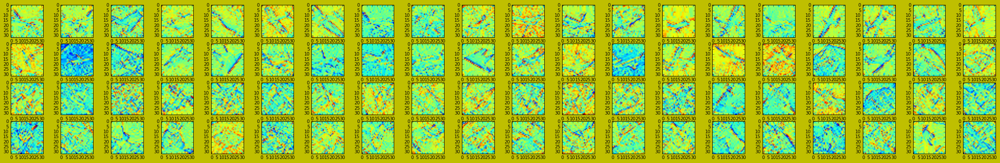

In [42]:
from __future__ import division
import numpy as np


def featureaMeanNorm(image):     
    return (image - np.mean(image, axis=0))


# def ZCA_whiteness(img):
#     img = featureaMeanNorm(img)
#     sigma_mat = np.dot(img,np.transpose(img))/img.shape[1]
#     u,s,_ = np.linalg.svd(sigma_mat)
#     img_rot = np.dot(np.transpose(u), img)
# #         x_reduced = np.dot(np.transpose(u[:,0:2]), x)#x_rot[:,0:2]
#     denominator = np.diag(1/pow(s+epsilon,0.5))
#     PCA_whitening = np.dot(denominator, img_rot)
#     ZCA_whitening = np.dot(u, PCA_whitening)
#     return ZCA_whitening
        


def ZCA_whitening(img):
    epsilon =0.1
    img = featureaMeanNorm(img)
    sigma_mat = np.dot(img,np.transpose(img))/img.shape[1]
#     sigma_mat = np.cov(img, rowvar=True)
    U,S,_ = np.linalg.svd(sigma_mat)
    
    img_rot = np.dot(U.T, img)
    denominator = np.diag(1.0/np.sqrt(S+epsilon))
    PCA_whitening = np.dot(denominator, img_rot)
    
    ZCA_whitening = np.dot(U, PCA_whitening)
    return ZCA_whitening

imageZCA = [ZCA_whitening(img) for img in imageGray]
vizualize(imageZCA,rows=4,columns=20)

(80, 32, 32, 3)


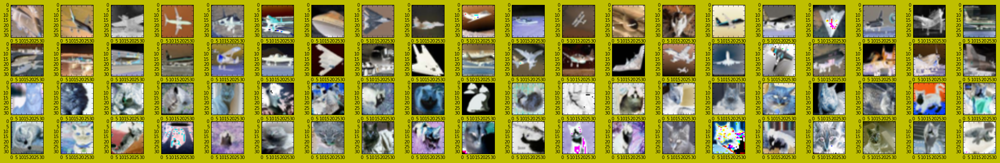

In [22]:
# Vizualizing Tensorflow operation

# Note Tensor flow takes input of 4 tensors, 
import tensorflow as tf

imgTensor = np.ndarray(shape=(80,32,32,3))
print (imgTensor.shape)
for i,img in enumerate(imageArr):
    imgTensor[i,:] = img
    
# print (inputTensor)

# Sanity Check if all the image are stacked properly in teh inputTensor
imgList = [imgTensor[i] for i in np.arange(imgTensor.shape[0])]
vizualize(imgList,rows=4,columns=20)

    

In [17]:
inputTensor.shape

(32, 32, 3)

In [38]:
# # from sklearn.decomposition import PCA

# # # ZCA Whitening:
# def featureaMeanNorm(image):     
#     return (image - np.mean(image, axis=0))


# x = np.array([[1,2,3],[4,3,5],[2,3,4],[5,6,8]])

# print (np.mean(x, axis=0))
# x = featureaMeanNorm(x)
# sigma_mat = np.dot(x,np.transpose(x))/x.shape[1]
# u,s,_ = np.linalg.svd(sigma_mat)
# x_rot = np.dot(np.transpose(u),x)
# x_reduced = np.dot(np.transpose(u[:,0:2]), x)#x_rot[:,0:2]
# epsilon = 0.1

# denominator = np.diag(1/pow(s+epsilon,0.5))
# PCA_whitening = np.dot(denominator, x_rot)
# ZCA_whitening = np.dot(u, PCA_whitening)


# print ('x: ', x)
# print ('')
# print ('x_cov: ',sigma_mat)
# print ('')
# print ('u: ', u)
# print ('')
# print ('s', s)
# print ('')
# print ('x_rot: ', x_rot)
# print ('')
# print ('x_reduced: ', x_reduced)
# print ('')
# print ('pow(s_diag+epsilon,0.5): ', 1/pow(s+epsilon,0.5))
# print('')
# print ('PCA_whitening: ', PCA_whitening)
# print('')
# print ('ZCA_whitening: ', ZCA_whitening)

# print ('########################################################################################################################')


# def ZCA_whiteness(img):
# #     img = featureaMeanNorm(img)
#     epsilon =0.1
# #     sigma_mat = np.dot(img,np.transpose(img))/img.shape[1]
#     sigma_mat = np.cov(img, rowvar=True)
#     U,S,_ = np.linalg.svd(sigma_mat)
    
#     img_rot = np.dot(U.T, img)
#     denominator = np.diag(1.0/np.sqrt(S+epsilon))
#     PCA_whitening = np.dot(denominator, img_rot)
    
#     ZCA_whitening = np.dot(U, PCA_whitening)
#     return ZCA_whitening

# ZCA_whitening = ZCA_whiteness(np.array([[1,2,3],[4,3,5],[2,3,4],[5,6,8]]))



# print('###########')
# print ('ZCA_whitening: ', ZCA_whitening)

# print ('########################################################################################################################')



# def ZCA_whitening(X):
#     """
#     Function to compute ZCA whitening matrix (aka Mahalanobis whitening).
#     INPUT:  X: [M x N] matrix.
#         Rows: Variables
#         Columns: Observations
#     OUTPUT: ZCAMatrix: [M x M] matrix
#     """
#     # Covariance matrix [column-wise variables]: Sigma = (X-mu)' * (X-mu) / N
#     sigma = np.cov(X, rowvar=True) # [M x M]
#     # Singular Value Decomposition. X = U * np.diag(S) * V
#     U,S,V = np.linalg.svd(sigma)
#         # U: [M x M] eigenvectors of sigma.
#         # S: [M x 1] eigenvalues of sigma.
#         # V: [M x M] transpose of U
#     # Whitening constant: prevents division by zero
#     epsilon = 0.1# 1e-5
#     # ZCA Whitening matrix: U * Lambda * U'
#     ZCAMatrix = np.dot(U, np.dot(np.diag(1.0/np.sqrt(S + epsilon)), U.T)) # [M x M]
#     xZCAMatrix = np.dot(ZCAMatrix, X)
#     return xZCAMatrix


# ZCA_whitening = ZCA_whitening(np.array([[1,2,3],[4,3,5],[2,3,4],[5,6,8]]))
# print ('*************')
# print ('ZCA_whitening: ', ZCA_whitening)


# print ('########################################################################################################################')


# # # print (u[:,0:2])

# # print ('#################')
# # print ('')
# # decompose = PCA(n_components=2)
# # xx = decompose.fit_transform(x)
# # print (xx)
# # # print (decompose.explained_variance_ratio_)

[ 3.   3.5  5. ]
x:  [[-2.  -1.5 -2. ]
 [ 1.  -0.5  0. ]
 [-1.  -0.5 -1. ]
 [ 2.   2.5  3. ]]

x_cov:  [[ 3.41666667 -0.41666667  1.58333333 -4.58333333]
 [-0.41666667  0.41666667 -0.25        0.25      ]
 [ 1.58333333 -0.25        0.75       -2.08333333]
 [-4.58333333  0.25       -2.08333333  6.41666667]]

u:  [[-0.56781092  0.27204945  0.59462581  0.5       ]
 [ 0.04939616 -0.86433101  0.02217943  0.5       ]
 [-0.26078005  0.25417482 -0.785741    0.5       ]
 [ 0.7791948   0.33810673  0.16893577  0.5       ]]

s [  1.04697064e+01   5.23536559e-01   6.75701243e-03   1.54929748e-16]

x_rot:  [[  3.00418766e+00   2.90539534e+00   3.73398630e+00]
 [ -9.86391274e-01   7.42270742e-01   2.16046466e-01]
 [ -4.34596523e-02  -8.78185046e-02   1.03296690e-01]
 [  2.22044605e-15   4.55191440e-15  -5.10702591e-15]]

x_reduced:  [[ 3.00418766  2.90539534  3.7339863 ]
 [-0.98639127  0.74227074  0.21604647]]

pow(s_diag+epsilon,0.5):  [ 0.3075874   1.26639457  3.06056632  3.16227766]

PCA_whitening

In [24]:
# # # decompose = PCA(n_components=3)
# # # x = decompose.fit_transform(x)
# from sklearn.decomposition import PCA

# x = np.array([[1,2,3],[4,3,5],[2,3,4],[5,6,8]])

# pca = PCA(whiten=True)
# transformed = pca.fit_transform(x)
# pca.whiten = False
# zca = pca.inverse_transform(transformed)

# print (zca)

[[ 1.6  2.5  5.2]
 [ 4.4  2.5  4.8]
 [ 2.8  4.5  3.6]
 [ 3.2  4.5  6.4]]
